<img src="https://upload.wikimedia.org/wikipedia/de/thumb/5/5b/Hochschule-aalen.svg/2000px-Hochschule-aalen.svg.png" alt="last access: 29.09.2021" width="400" height="30" style="float:right"/>

<img src="https://upload.wikimedia.org/wikipedia/de/thumb/4/41/Groupe_SEB_logo.svg/1200px-Groupe_SEB_logo.svg.png" alt="last access: 11.09.2022" width="30" height="30" style="float:left"/>

<hr style="height:2px;border:none;color:#003A6C;background-color:#003A6C;" />


Master Thesis Jessica Weiler, M.Sc. Data Science and Business Analytics 

# Image aesthetics assessment (IAA) of food and beverages using deep learning

## Testcase 2: Image Preprocessing
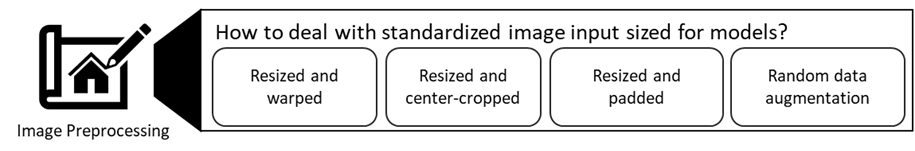

* I<sup>warped</sup>: The images are resized and warped into 224 x 224 patches. 
* I<sup>cropped</sup>: The images are first resized with respect to the shortest edge and then center-cropped into 224 x 224 patches.
* I<sup>padded</sup>: The images are resized with respect to the longest edge and then padded into 224 x 224 patches.   
* I<sup>augmentation</sup>: Data augmentation such as rotation, shift range, vertical and horizontal flip is conducted. Additionally, brightness and zoom are manipulated by a random factor between 0.2 and 1.5 and 0 and 1.5 respectively. The images are then resized into 224 x 224 patches.


### Load libraries

In [2]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd 
import os
import PIL
import PIL.Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import time
import datetime
from glob import glob

import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, accuracy_score
from sklearn.model_selection import GridSearchCV, validation_curve, train_test_split, RandomizedSearchCV

import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, Xception, ResNet50, inception_v3
from keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense,Flatten
# Image processing / Data Augmentation 
from tensorflow.keras.preprocessing.image import ImageDataGenerator





### Set Paths

In [3]:
#Set paths

#Set workdir
wpth =os.path.abspath(os.getcwd()).replace("\\","/")

#Save data save path
save_data_dir = os.path.join(wpth, 'Saved_Data').replace("\\","/")
checkpoint_dir=  os.path.join(save_data_dir, 'Checkpoint').replace("\\","/")
datagen_dir=  os.path.join(save_data_dir, 'Datagen').replace("\\","/")
df_model_histor_dir=  os.path.join(save_data_dir, 'df_model_history').replace("\\","/")


#Set folderpath GPD 
GPD_pth = os.path.join(wpth, 'Dataset','GPD').replace("\\","/")
GPD_test_pth = os.path.join(GPD_pth, 'Data').replace("\\","/")

#Set folderpath RIAA 
RIAA_pth = os.path.join(wpth, 'Dataset','RIAA').replace("\\","/")

RIAA_train_pth = os.path.join(RIAA_pth, 'Data_Split', 'train').replace("\\","/")
RIAA_test_pth = os.path.join(RIAA_pth, 'Data_Split', 'test').replace("\\","/")
RIAA_val_pth = os.path.join(RIAA_pth, 'Data_Split', 'val').replace("\\","/")

RIAA_224_train_pth = os.path.join(RIAA_pth, 'Data_Split_224', 'train').replace("\\","/")
RIAA_224_test_pth = os.path.join(RIAA_pth, 'Data_Split_224', 'test').replace("\\","/")
RIAA_224_val_pth = os.path.join(RIAA_pth, 'Data_Split_224', 'val').replace("\\","/")

RIAA_224_binary_balanced_train_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_Balanced_224', 'train').replace("\\","/")
RIAA_224_binary_balanced_test_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_Balanced_224', 'test').replace("\\","/")
RIAA_224_binary_balanced_val_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_Balanced_224', 'val').replace("\\","/")

RIAA_224_binary_warped_train_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_224', 'train').replace("\\","/")
RIAA_224_binary_warped_test_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_224', 'test').replace("\\","/")
RIAA_224_binary_warped_val_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_224', 'val').replace("\\","/")

RIAA_224_binary_cropped_train_pth = os.path.join(RIAA_pth, 'Data_Split_Resized_Cropped_224', 'train').replace("\\","/")
RIAA_224_binary_cropped_test_pth = os.path.join(RIAA_pth, 'Data_Split_Resized_Cropped_224', 'test').replace("\\","/")
RIAA_224_binary_cropped_val_pth = os.path.join(RIAA_pth, 'Data_Split_Resized_Cropped_224', 'val').replace("\\","/")

RIAA_224_binary_padded_train_pth = os.path.join(RIAA_pth, 'Data_Split_Resized_Padded_224', 'train').replace("\\","/")
RIAA_224_binary_padded_test_pth = os.path.join(RIAA_pth, 'Data_Split_Resized_Padded_224', 'test').replace("\\","/")
RIAA_224_binary_padded_val_pth = os.path.join(RIAA_pth, 'Data_Split_Resized_Padded_224', 'val').replace("\\","/")

image_effects_pth= os.path.join(RIAA_pth, 'Image_Settings').replace("\\","/")

## Preparation of RIAA

In [22]:
#import splitfolders
#splitfolders.ratio(os.path.join(RIAA_pth, 'Resized_Padded_224').replace("\\","/"), output=os.path.join(RIAA_pth, 'Data_Split_Resized_Padded_224'), seed=1337, ratio=(.8, 0.1,0.1)) 

In [23]:
#import splitfolders
#splitfolders.ratio(os.path.join(RIAA_pth, 'Data').replace("\\","/"), output=os.path.join(RIAA_pth, 'Data_Split'), seed=1337, ratio=(.8, 0.1,0.1)) 

In [4]:
#data_gen=ImageDataGenerator(zoom_range=0.2, shear_range=.2, horizontal_flip=True, rescale=1/255)
datagen = ImageDataGenerator(rescale = 1./255, horizontal_flip=True)
datagen_test = ImageDataGenerator(rescale = 1./255)
datagen_random = ImageDataGenerator(rescale = 1./255, horizontal_flip=True,rotation_range=30, fill_mode='nearest', width_shift_range=0.2, height_shift_range=0.2, vertical_flip=True, brightness_range=[0.2,1.5],zoom_range=[0, 1.5] )

## Modelling

### VGG16 Base Model

In [4]:
seed_value = 42

In [26]:
vgg16_obj = VGG16(include_top = False, weights=None,input_shape = (224,224,3))    #  include_top = False is used to skip the layer from flattern
vgg16_obj.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [27]:
vgg16_obj.output

<KerasTensor: shape=(None, 7, 7, 512) dtype=float32 (created by layer 'block5_pool')>

In [28]:
num_classes=2
image_size=224

In [29]:
last_layer = vgg16_obj.get_layer('block5_pool')
last_output = vgg16_obj.output

x = Flatten()(last_output)
x = tf.keras.layers.Dense(4096, activation='relu')(x) #, kernel_initializer=tf.keras.initializers.glorot_normal(seed=seed_value),
                 # bias_initializer=tf.keras.initializers.Zeros()
x = tf.keras.layers.Dense(4096, activation='relu')(x)
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

In [30]:
#Merge
model = tf.keras.Model(vgg16_obj.input, x)

In [31]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [32]:
#EarlyStop
callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=20, restore_best_weights=True)

### I<sup>warped</sup>

In [33]:
checkpoint_model_dir=  os.path.join(checkpoint_dir, 'vanilla_vgg16_warped-{epoch:03d}-{accuracy:.4f}-{val_accuracy:.4f}.h5').replace("\\","/")

In [34]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_model_dir,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [35]:
# load and iterate dataset
train_data = datagen.flow_from_directory(RIAA_224_binary_warped_train_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=True, seed=seed_value)
val_data = datagen_test.flow_from_directory(RIAA_224_binary_warped_val_pth, class_mode='binary',target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value)
test_data = datagen_test.flow_from_directory(RIAA_224_binary_warped_test_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )

Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.


In [36]:
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-3, momentum=0.9,
    nesterov=True),loss='binary_crossentropy', metrics=['accuracy'])

In [37]:
start_time = time.time()

In [38]:
vgg_classifier = model.fit(train_data, validation_data=val_data, verbose=1,  callbacks=[callback_earlystop, checkpoint_callback], epochs=1000)

Epoch 1/1000
452/452 [==============================] - 93s 203ms/step - loss: 0.6822 - accuracy: 0.5716 - val_loss: 0.6741 - val_accuracy: 0.5728
Epoch 2/1000
452/452 [==============================] - 91s 202ms/step - loss: 0.6294 - accuracy: 0.6150 - val_loss: 0.5499 - val_accuracy: 0.7028
Epoch 3/1000
452/452 [==============================] - 91s 201ms/step - loss: 0.5591 - accuracy: 0.7104 - val_loss: 0.5661 - val_accuracy: 0.7089
Epoch 4/1000
452/452 [==============================] - 91s 201ms/step - loss: 0.5331 - accuracy: 0.7381 - val_loss: 0.5075 - val_accuracy: 0.7460
Epoch 5/1000
452/452 [==============================] - 91s 201ms/step - loss: 0.5210 - accuracy: 0.7470 - val_loss: 0.4769 - val_accuracy: 0.7714
Epoch 6/1000
452/452 [==============================] - 91s 201ms/step - loss: 0.5120 - accuracy: 0.7565 - val_loss: 0.5398 - val_accuracy: 0.7421
Epoch 7/1000
452/452 [==============================] - 91s 201ms/step - loss: 0.5088 - accuracy: 0.7568 - val_loss: 0

In [39]:
stop_time = time.time()
time_delta=stop_time - start_time
print("--- %s seconds ---" % (stop_time - start_time))
str(datetime.timedelta(seconds=time_delta))

--- 4600.532011985779 seconds ---


'1:16:40.532012'

In [40]:
#save model history
df_history =pd.DataFrame(vgg_classifier.history)
model_history_dir=  os.path.join(df_model_histor_dir, 'df_history_vanilla_vgg16_base_model_warped_images.csv').replace("\\","/")
df_history.to_csv(model_history_dir)

Text(0.5, 0, 'epoch')

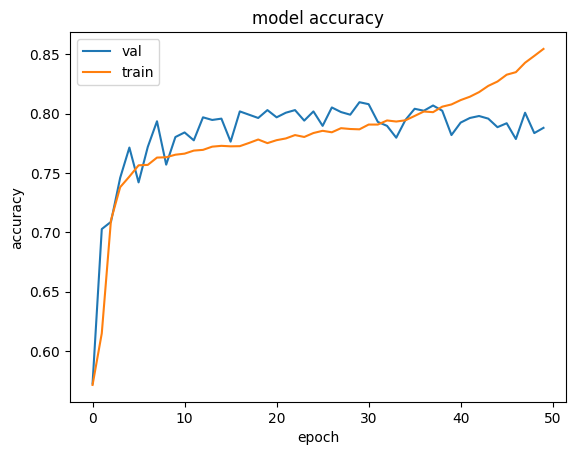

In [41]:
plt.plot(vgg_classifier.history['val_accuracy'])
plt.plot(vgg_classifier.history['accuracy'])
plt.legend(['val','train'], loc='upper left')
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')

Text(0.5, 0, 'epoch')

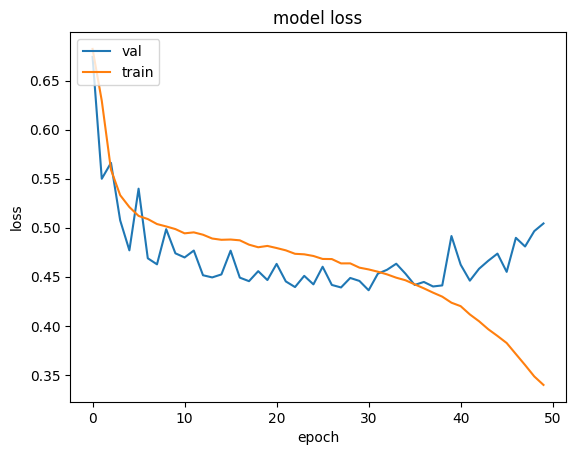

In [42]:
plt.plot(vgg_classifier.history['val_loss'])
plt.plot(vgg_classifier.history['loss'])
plt.legend(['val','train'], loc='upper left')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

In [45]:
model.evaluate(test_data)

57/57 [==============================] - 5s 81ms/step - loss: 0.4722 - accuracy: 0.7922


[0.47220268845558167, 0.7921503782272339]

In [46]:
pred = model.predict(test_data)
pd.DataFrame(classification_report(test_data.classes, pred > 0.5, output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.744760,0.830661,0.79215,0.787710,0.793955
recall,0.781371,0.800193,0.79215,0.790782,0.792150
f1-score,0.762626,0.815143,0.79215,0.788884,0.792702
support,773.000000,1036.000000,0.79215,1809.000000,1809.000000


In [47]:
true_classes = test_data.classes

In [48]:
reality = [0 if x > 0.5 else 1 for x in true_classes]
#reality

In [49]:
predictions = [0 if x > 0.5 else 1 for x in pred]
#predictions

In [50]:
accuracy = accuracy_score(reality, predictions)
print("Test Accuracy:", accuracy)

Test Accuracy: 0.7921503593145384


In [51]:
predicted_classes = pred.round() 
class_labels = list(test_data.class_indices.keys())

In [52]:
report = classification_report(true_classes, predicted_classes, target_names=class_labels, digits=4)
print(report)

               precision    recall  f1-score   support

0_Unaesthetic     0.7448    0.7814    0.7626       773
  1_Aesthetic     0.8307    0.8002    0.8151      1036

     accuracy                         0.7922      1809
    macro avg     0.7877    0.7908    0.7889      1809
 weighted avg     0.7940    0.7922    0.7927      1809



In [53]:
cm = confusion_matrix(true_classes, predicted_classes)

Text(0.5, 1.0, 'Evaluation with warped images')

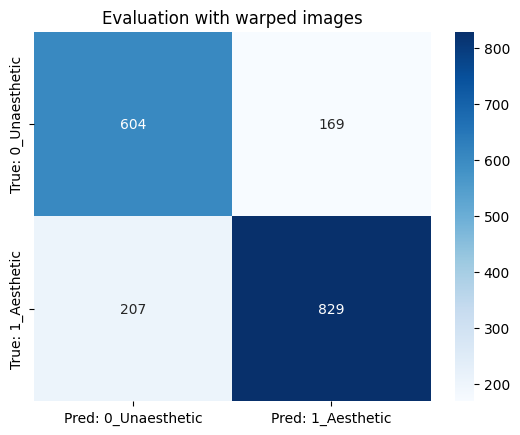

In [54]:
sns.heatmap(cm, annot= True, xticklabels = ['Pred: 0_Unaesthetic', 'Pred: 1_Aesthetic'],
           yticklabels = ['True: 0_Unaesthetic', 'True: 1_Aesthetic'], cmap='Blues', fmt='g').set_title('Evaluation with warped images')

### I<sup>cropped</sup>


In [55]:
vgg16_obj = VGG16(include_top = False, weights=None,input_shape = (224,224,3))    #  include_top = False is used to skip the layer from flattern
vgg16_obj.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [56]:
vgg16_obj.output

<KerasTensor: shape=(None, 7, 7, 512) dtype=float32 (created by layer 'block5_pool')>

In [57]:
num_classes=2
image_size=224

In [58]:
last_layer = vgg16_obj.get_layer('block5_pool')
last_output = vgg16_obj.output

x = Flatten()(last_output)
x = tf.keras.layers.Dense(4096, activation='relu')(x) #, kernel_initializer=tf.keras.initializers.glorot_normal(seed=seed_value),
                 # bias_initializer=tf.keras.initializers.Zeros()
#x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(4096, activation='relu')(x)
#x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

In [59]:
#Merge
model = tf.keras.Model(vgg16_obj.input, x)

In [60]:
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [61]:
#EarlyStop
callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=20, restore_best_weights=True)

In [62]:
checkpoint_model_dir=  os.path.join(checkpoint_dir, 'vanilla_vgg16_cropped-{epoch:03d}-{accuracy:.4f}-{val_accuracy:.4f}.h5').replace("\\","/")

In [63]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_model_dir,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [64]:
# load and iterate dataset
train_data = datagen.flow_from_directory(RIAA_224_binary_cropped_train_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=True, seed=seed_value )
val_data = datagen_test.flow_from_directory(RIAA_224_binary_cropped_val_pth, class_mode='binary',target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )
test_data = datagen_test.flow_from_directory(RIAA_224_binary_cropped_test_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )

Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.


In [65]:
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-3, momentum=0.9,
    nesterov=True),loss='binary_crossentropy', metrics=['accuracy'])

In [66]:
start_time = time.time()

In [67]:
vgg_classifier = model.fit(train_data, validation_data=val_data, verbose=1,  callbacks=[callback_earlystop, checkpoint_callback ], epochs=1000)

Epoch 1/1000
452/452 [==============================] - 93s 204ms/step - loss: 0.6807 - accuracy: 0.5728 - val_loss: 0.6639 - val_accuracy: 0.5728
Epoch 2/1000
452/452 [==============================] - 91s 202ms/step - loss: 0.6106 - accuracy: 0.6462 - val_loss: 0.5313 - val_accuracy: 0.7344
Epoch 3/1000
452/452 [==============================] - 92s 202ms/step - loss: 0.5479 - accuracy: 0.7259 - val_loss: 0.4793 - val_accuracy: 0.7770
Epoch 4/1000
452/452 [==============================] - 92s 202ms/step - loss: 0.5272 - accuracy: 0.7452 - val_loss: 0.4768 - val_accuracy: 0.7659
Epoch 5/1000
452/452 [==============================] - 92s 202ms/step - loss: 0.5168 - accuracy: 0.7488 - val_loss: 0.4750 - val_accuracy: 0.7670
Epoch 6/1000
452/452 [==============================] - 91s 202ms/step - loss: 0.5105 - accuracy: 0.7541 - val_loss: 0.4758 - val_accuracy: 0.7825
Epoch 7/1000
452/452 [==============================] - 91s 202ms/step - loss: 0.5077 - accuracy: 0.7577 - val_loss: 0

In [68]:
stop_time = time.time()
time_delta=stop_time - start_time
print("--- %s seconds ---" % (stop_time - start_time))
str(datetime.timedelta(seconds=time_delta))

--- 5245.088817119598 seconds ---


'1:27:25.088817'

In [69]:
#save model history
df_history =pd.DataFrame(vgg_classifier.history)
model_history_dir=  os.path.join(df_model_histor_dir, 'df_history_vanilla_vgg16_base_model_cropped_images.csv').replace("\\","/")
df_history.to_csv(model_history_dir)

Text(0.5, 0, 'epoch')

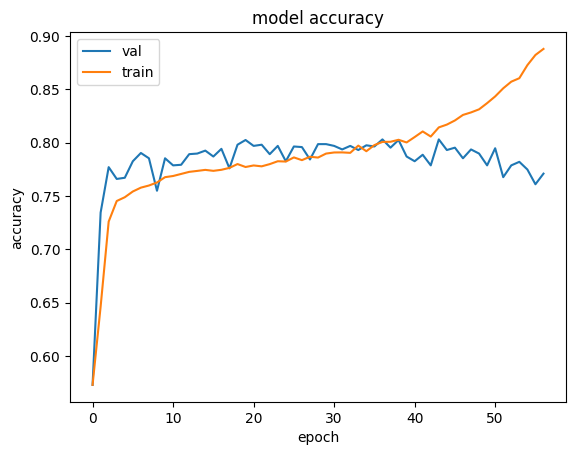

In [70]:
plt.plot(vgg_classifier.history['val_accuracy'])
plt.plot(vgg_classifier.history['accuracy'])
plt.legend(['val','train'], loc='upper left')
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')

Text(0.5, 0, 'epoch')

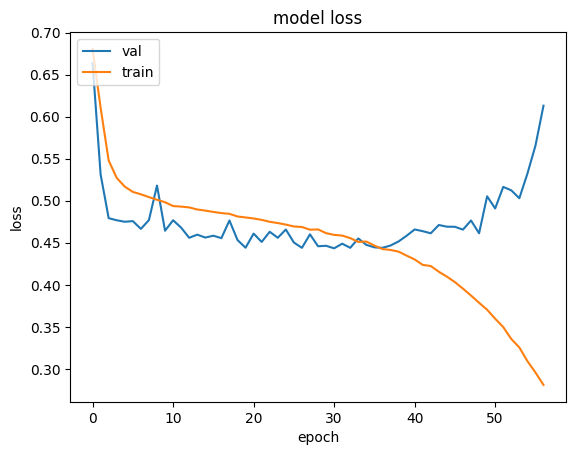

In [71]:
plt.plot(vgg_classifier.history['val_loss'])
plt.plot(vgg_classifier.history['loss'])
plt.legend(['val','train'], loc='upper left')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

In [73]:
model.evaluate(test_data)

57/57 [==============================] - 5s 83ms/step - loss: 0.4647 - accuracy: 0.7971


[0.46471449732780457, 0.7971254587173462]

In [74]:
pred = model.predict(test_data)
pd.DataFrame(classification_report(test_data.classes, pred > 0.5, output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.750617,0.834835,0.797125,0.792726,0.798848
recall,0.786546,0.805019,0.797125,0.795783,0.797125
f1-score,0.768162,0.819656,0.797125,0.793909,0.797652
support,773.000000,1036.000000,0.797125,1809.000000,1809.000000


In [75]:
true_classes = test_data.classes

In [76]:
reality = [0 if x > 0.5 else 1 for x in true_classes]
#reality
predictions = [0 if x > 0.5 else 1 for x in pred]
#predictions

In [77]:
accuracy = accuracy_score(reality, predictions)
print("Test Accuracy:", accuracy)

Test Accuracy: 0.7971254836926479


In [78]:
predicted_classes = pred.round() #round_pred#np.argmax(round_pred, axis=1)
#true_classes = test_data.classes
class_labels = list(test_data.class_indices.keys())

In [79]:
report = classification_report(true_classes, predicted_classes, target_names=class_labels, digits=4)
print(report)

               precision    recall  f1-score   support

0_Unaesthetic     0.7506    0.7865    0.7682       773
  1_Aesthetic     0.8348    0.8050    0.8197      1036

     accuracy                         0.7971      1809
    macro avg     0.7927    0.7958    0.7939      1809
 weighted avg     0.7988    0.7971    0.7977      1809



In [80]:
cm = confusion_matrix(true_classes, predicted_classes)

Text(0.5, 1.0, 'Evaluation with cropped images')

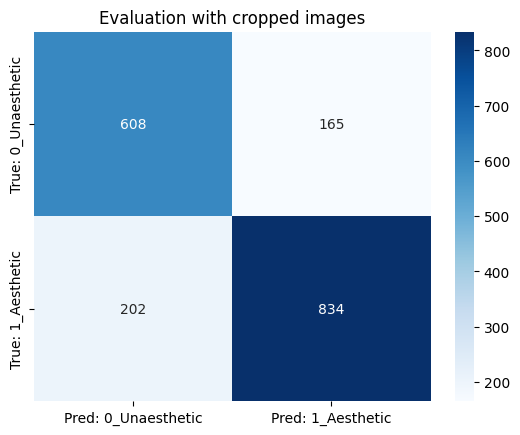

In [81]:
sns.heatmap(cm, annot= True, xticklabels = ['Pred: 0_Unaesthetic', 'Pred: 1_Aesthetic'],
           yticklabels = ['True: 0_Unaesthetic', 'True: 1_Aesthetic'], cmap='Blues', fmt='g').set_title('Evaluation with cropped images')

### I<sup>padded</sup>


In [82]:
vgg16_obj = VGG16(include_top = False, weights=None,input_shape = (224,224,3))    #  include_top = False is used to skip the layer from flattern
#for layer in vgg16_obj.layers:             # Off the training of the trainable parameters
#    layer.trainable = False
vgg16_obj.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [83]:
vgg16_obj.output

<KerasTensor: shape=(None, 7, 7, 512) dtype=float32 (created by layer 'block5_pool')>

In [84]:
num_classes=2
image_size=224

In [85]:
last_layer = vgg16_obj.get_layer('block5_pool')
last_output = vgg16_obj.output

x = Flatten()(last_output)
x = tf.keras.layers.Dense(4096, activation='relu')(x) #, kernel_initializer=tf.keras.initializers.glorot_normal(seed=seed_value),
                 # bias_initializer=tf.keras.initializers.Zeros()
#x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(4096, activation='relu')(x)
#x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

In [86]:
#Merge
model = tf.keras.Model(vgg16_obj.input, x)

In [87]:
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [88]:
#EarlyStop
callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=20, restore_best_weights=True)

In [89]:
checkpoint_model_dir=  os.path.join(checkpoint_dir, 'vanilla_vgg16_padded-{epoch:03d}-{accuracy:.4f}-{val_accuracy:.4f}.h5').replace("\\","/")

In [90]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_model_dir,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [91]:
# load and iterate dataset
train_data = datagen.flow_from_directory(RIAA_224_binary_padded_train_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=True, seed=seed_value )
val_data = datagen_test.flow_from_directory(RIAA_224_binary_padded_val_pth, class_mode='binary',target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )
test_data = datagen_test.flow_from_directory(RIAA_224_binary_padded_test_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )

Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.


In [92]:
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-3, momentum=0.9,
    nesterov=True),loss='binary_crossentropy', metrics=['accuracy'])

In [93]:
start_time = time.time()

In [94]:
vgg_classifier = model.fit(train_data, validation_data=val_data, verbose=1,  callbacks=[callback_earlystop, checkpoint_callback ], epochs=1000)

Epoch 1/1000
452/452 [==============================] - 93s 204ms/step - loss: 0.6803 - accuracy: 0.5729 - val_loss: 0.6647 - val_accuracy: 0.5728
Epoch 2/1000
452/452 [==============================] - 92s 202ms/step - loss: 0.6116 - accuracy: 0.6416 - val_loss: 0.5539 - val_accuracy: 0.7056
Epoch 3/1000
452/452 [==============================] - 92s 203ms/step - loss: 0.5564 - accuracy: 0.7106 - val_loss: 0.5111 - val_accuracy: 0.7648
Epoch 4/1000
452/452 [==============================] - 91s 201ms/step - loss: 0.5320 - accuracy: 0.7315 - val_loss: 0.5289 - val_accuracy: 0.7438
Epoch 5/1000
452/452 [==============================] - 92s 203ms/step - loss: 0.5215 - accuracy: 0.7450 - val_loss: 0.4697 - val_accuracy: 0.7820
Epoch 6/1000
452/452 [==============================] - 91s 202ms/step - loss: 0.5099 - accuracy: 0.7541 - val_loss: 0.4786 - val_accuracy: 0.7869
Epoch 7/1000
452/452 [==============================] - 92s 203ms/step - loss: 0.5062 - accuracy: 0.7596 - val_loss: 0

In [95]:
stop_time = time.time()
time_delta=stop_time - start_time
print("--- %s seconds ---" % (stop_time - start_time))
str(datetime.timedelta(seconds=time_delta))

--- 5431.7300572395325 seconds ---


'1:30:31.730057'

In [96]:
#save model history
df_history =pd.DataFrame(vgg_classifier.history)
model_history_dir=  os.path.join(df_model_histor_dir, 'df_history_vanilla_vgg16_base_model_padded_images.csv').replace("\\","/")
df_history.to_csv(model_history_dir)

Text(0.5, 0, 'epoch')

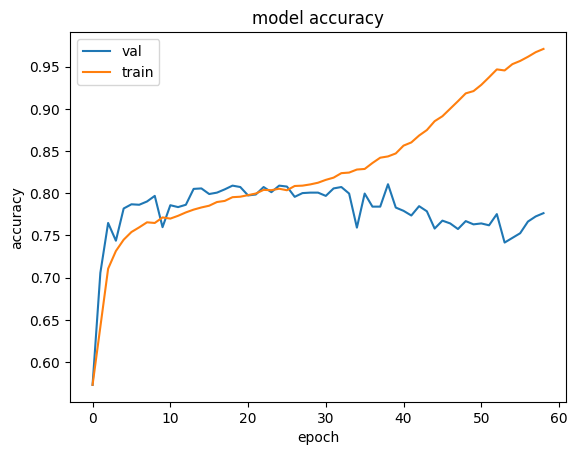

In [97]:
plt.plot(vgg_classifier.history['val_accuracy'])
plt.plot(vgg_classifier.history['accuracy'])
plt.legend(['val','train'], loc='upper left')
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')

Text(0.5, 0, 'epoch')

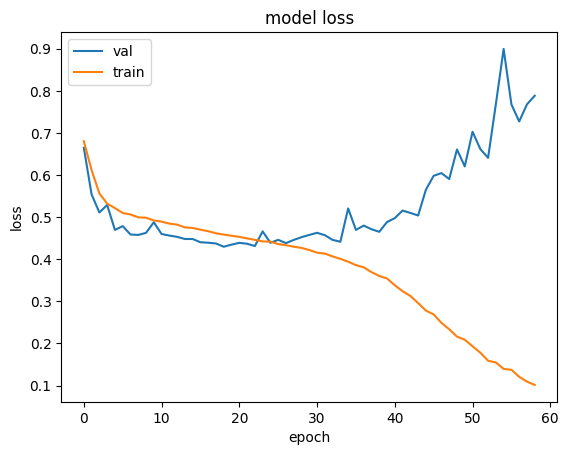

In [98]:
plt.plot(vgg_classifier.history['val_loss'])
plt.plot(vgg_classifier.history['loss'])
plt.legend(['val','train'], loc='upper left')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

In [100]:
model.evaluate(test_data)

57/57 [==============================] - 5s 80ms/step - loss: 0.5039 - accuracy: 0.7877


[0.5039413571357727, 0.7877280116081238]

In [101]:
pred = model.predict(test_data)
pd.DataFrame(classification_report(test_data.classes, pred > 0.5, output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.738650,0.827968,0.787728,0.783309,0.789802
recall,0.778784,0.794402,0.787728,0.786593,0.787728
f1-score,0.758186,0.810837,0.787728,0.784512,0.788339
support,773.000000,1036.000000,0.787728,1809.000000,1809.000000


In [102]:
true_classes = test_data.classes

In [103]:
reality = [0 if x > 0.5 else 1 for x in true_classes]
#reality
predictions = [0 if x > 0.5 else 1 for x in pred]
#predictions

In [104]:
accuracy = accuracy_score(reality, predictions)
print("Test Accuracy:", accuracy)

Test Accuracy: 0.7877280265339967


In [105]:
predicted_classes = pred.round() #round_pred#np.argmax(round_pred, axis=1)
#true_classes = test_data.classes
class_labels = list(test_data.class_indices.keys())

In [106]:
report = classification_report(true_classes, predicted_classes, target_names=class_labels, digits=4)
print(report)

               precision    recall  f1-score   support

0_Unaesthetic     0.7387    0.7788    0.7582       773
  1_Aesthetic     0.8280    0.7944    0.8108      1036

     accuracy                         0.7877      1809
    macro avg     0.7833    0.7866    0.7845      1809
 weighted avg     0.7898    0.7877    0.7883      1809



In [107]:
cm = confusion_matrix(true_classes, predicted_classes)

Text(0.5, 1.0, 'Evaluation with padded images')

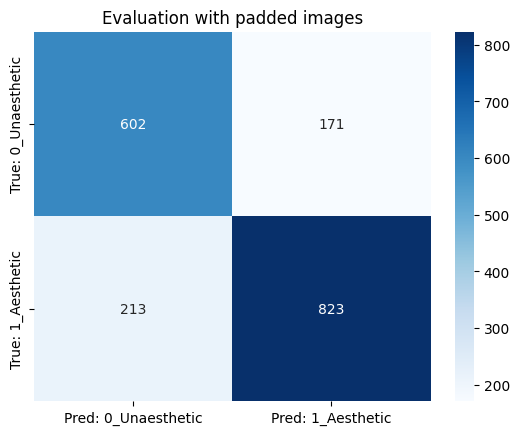

In [108]:
sns.heatmap(cm, annot= True, xticklabels = ['Pred: 0_Unaesthetic', 'Pred: 1_Aesthetic'],
           yticklabels = ['True: 0_Unaesthetic', 'True: 1_Aesthetic'], cmap='Blues', fmt='g').set_title('Evaluation with padded images')

### I<sup>augmentation</sup>

In [ ]:
vgg16_obj = VGG16(include_top = False, weights=None,input_shape = (224,224,3))    #  include_top = False is used to skip the layer from flattern
#for layer in vgg16_obj.layers:             # Off the training of the trainable parameters
#    layer.trainable = False
vgg16_obj.summary()

In [110]:
vgg16_obj.output

<KerasTensor: shape=(None, 7, 7, 512) dtype=float32 (created by layer 'block5_pool')>

In [111]:
num_classes=2
image_size=224

In [112]:
last_layer = vgg16_obj.get_layer('block5_pool')
last_output = vgg16_obj.output

x = Flatten()(last_output)
x = tf.keras.layers.Dense(4096, activation='relu')(x) #, kernel_initializer=tf.keras.initializers.glorot_normal(seed=seed_value),
                 # bias_initializer=tf.keras.initializers.Zeros()
#x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(4096, activation='relu')(x)
#x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

In [113]:
#Merge
model = tf.keras.Model(vgg16_obj.input, x)

In [114]:
model.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [115]:
#EarlyStop
callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=20, restore_best_weights=True)

In [116]:
image_size=224

In [117]:
checkpoint_model_dir=  os.path.join(checkpoint_dir, 'vanilla_vgg16_random_data_argumentation-{epoch:03d}-{accuracy:.4f}-{val_accuracy:.4f}.h5').replace("\\","/")

In [118]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_model_dir,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [119]:
# load and iterate dataset
train_data = datagen_random.flow_from_directory(RIAA_224_binary_warped_train_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=True, seed=seed_value )
val_data = datagen_test.flow_from_directory(RIAA_224_binary_warped_val_pth, class_mode='binary',target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )
test_data = datagen_test.flow_from_directory(RIAA_224_binary_warped_test_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )

Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.


In [120]:
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-3, momentum=0.9,
    nesterov=True),loss='binary_crossentropy', metrics=['accuracy'])

In [121]:
start_time = time.time()

In [122]:
vgg_classifier = model.fit(train_data, validation_data=val_data, verbose=1,  callbacks=[callback_earlystop, checkpoint_callback ], epochs=1000)

Epoch 1/1000
452/452 [==============================] - 201s 442ms/step - loss: 0.6835 - accuracy: 0.5719 - val_loss: 0.6781 - val_accuracy: 0.5728
Epoch 2/1000
452/452 [==============================] - 202s 446ms/step - loss: 0.6766 - accuracy: 0.5728 - val_loss: 0.6542 - val_accuracy: 0.5728
Epoch 3/1000
452/452 [==============================] - 206s 455ms/step - loss: 0.6666 - accuracy: 0.5767 - val_loss: 0.6459 - val_accuracy: 0.5722
Epoch 4/1000
452/452 [==============================] - 211s 466ms/step - loss: 0.6579 - accuracy: 0.6080 - val_loss: 0.6296 - val_accuracy: 0.6165
Epoch 5/1000
452/452 [==============================] - 212s 469ms/step - loss: 0.6525 - accuracy: 0.6183 - val_loss: 0.6158 - val_accuracy: 0.6580
Epoch 6/1000
452/452 [==============================] - 207s 457ms/step - loss: 0.6498 - accuracy: 0.6246 - val_loss: 0.6256 - val_accuracy: 0.6032
Epoch 7/1000
452/452 [==============================] - 210s 465ms/step - loss: 0.6437 - accuracy: 0.6323 - val_

452/452 [==============================] - 205s 453ms/step - loss: 0.5581 - accuracy: 0.7133 - val_loss: 0.5169 - val_accuracy: 0.7543
Epoch 57/1000
452/452 [==============================] - 205s 453ms/step - loss: 0.5551 - accuracy: 0.7172 - val_loss: 0.5011 - val_accuracy: 0.7593
Epoch 58/1000
452/452 [==============================] - 203s 450ms/step - loss: 0.5477 - accuracy: 0.7272 - val_loss: 0.5014 - val_accuracy: 0.7620
Epoch 59/1000
452/452 [==============================] - 202s 447ms/step - loss: 0.5525 - accuracy: 0.7160 - val_loss: 0.4940 - val_accuracy: 0.7631
Epoch 60/1000
452/452 [==============================] - 203s 449ms/step - loss: 0.5507 - accuracy: 0.7221 - val_loss: 0.5110 - val_accuracy: 0.7582
Epoch 61/1000
452/452 [==============================] - 205s 452ms/step - loss: 0.5441 - accuracy: 0.7291 - val_loss: 0.5012 - val_accuracy: 0.7548
Epoch 62/1000
452/452 [==============================] - 204s 451ms/step - loss: 0.5472 - accuracy: 0.7210 - val_loss: 0

In [123]:
stop_time = time.time()
time_delta=stop_time - start_time
print("--- %s seconds ---" % (stop_time - start_time))
str(datetime.timedelta(seconds=time_delta))

--- 19878.23577260971 seconds ---


'5:31:18.235773'

In [124]:
#save model history
df_history =pd.DataFrame(vgg_classifier.history)
model_history_dir=  os.path.join(df_model_histor_dir, 'df_history_vanilla_vgg16_base_model_random_data_argumentation_images.csv').replace("\\","/")
df_history.to_csv(model_history_dir)

Text(0.5, 0, 'epoch')

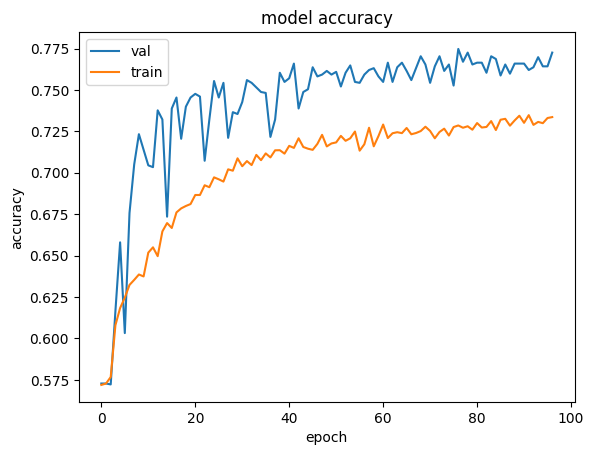

In [125]:
plt.plot(vgg_classifier.history['val_accuracy'])
plt.plot(vgg_classifier.history['accuracy'])
plt.legend(['val','train'], loc='upper left')
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')

Text(0.5, 0, 'epoch')

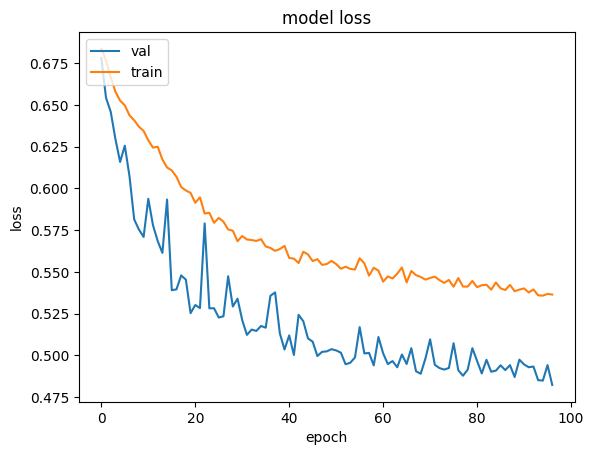

In [126]:
plt.plot(vgg_classifier.history['val_loss'])
plt.plot(vgg_classifier.history['loss'])
plt.legend(['val','train'], loc='upper left')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')

In [127]:
#model.save(checkpoint_model_dir)
#model=keras.models.load_model(checkpoint_model_dir)

In [128]:
model.evaluate(test_data)

57/57 [==============================] - 4s 76ms/step - loss: 0.4978 - accuracy: 0.7634


[0.4978087544441223, 0.7634052038192749]

In [129]:
pred = model.predict(test_data)
pd.DataFrame(classification_report(test_data.classes, pred > 0.5, output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.708082,0.810204,0.763405,0.759143,0.766567
recall,0.759379,0.766409,0.763405,0.762894,0.763405
f1-score,0.732834,0.787698,0.763405,0.760266,0.764254
support,773.000000,1036.000000,0.763405,1809.000000,1809.000000


In [130]:
true_classes = test_data.classes

In [131]:
reality = [0 if x > 0.5 else 1 for x in true_classes]
#reality
predictions = [0 if x > 0.5 else 1 for x in pred]
#predictions

In [132]:
accuracy = accuracy_score(reality, predictions)
print("Test Accuracy:", accuracy)

Test Accuracy: 0.7634051962410171


In [133]:
predicted_classes = pred.round() 
class_labels = list(test_data.class_indices.keys())

In [134]:
report = classification_report(true_classes, predicted_classes, target_names=class_labels, digits=4)
print(report)

               precision    recall  f1-score   support

0_Unaesthetic     0.7081    0.7594    0.7328       773
  1_Aesthetic     0.8102    0.7664    0.7877      1036

     accuracy                         0.7634      1809
    macro avg     0.7591    0.7629    0.7603      1809
 weighted avg     0.7666    0.7634    0.7643      1809



In [135]:
cm = confusion_matrix(true_classes, predicted_classes)

### Evaluation

In [4]:
test_cases = ["warped",  "cropped", "padded"]
image_size= 224
seed_value=42

In [5]:
#loading best models

vgg16_model_warped = tf.keras.models.load_model(os.path.join(checkpoint_dir, 'vanilla_vgg16_warped-027-0.788-0.807.h5').replace("\\","/"))
vgg16_model_cropped = tf.keras.models.load_model(os.path.join(checkpoint_dir, 'vanilla_vgg16_cropped-037-0.8006-0.8030.h5').replace("\\","/"))
vgg16_model_padded = tf.keras.models.load_model(os.path.join(checkpoint_dir, 'vanilla_vgg16_padded-039-0.8437-0.8107.h5').replace("\\","/"))
vgg16_model_random = tf.keras.models.load_model(os.path.join(checkpoint_dir, 'vanilla_vgg16_random_data_argumentation-077-0.7286-0.7748.h5').replace("\\","/"))


---------- warped ----------
Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.
Found 24000 images belonging to 2 classes.
750/750 [==============================] - 79s 105ms/step - loss: 0.7011 - accuracy: 0.6441
---------------------------------------------------------------
Train accuracy
0.7925
----------
Validation accuracy
0.8074
Test accuracy
0.7927
Test accuracy on GPD dataset
0.6441
----------
TrueNegative accuracy
0.7503
TruePositive accuracy
0.8243
Balanced accuracy
0.7873


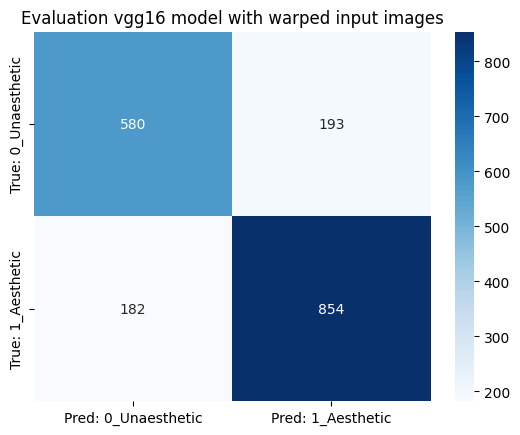

---------- cropped ----------
Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.
Found 24000 images belonging to 2 classes.
750/750 [==============================] - 64s 85ms/step - loss: 0.7044 - accuracy: 0.6525
---------------------------------------------------------------
Train accuracy
0.8066
----------
Validation accuracy
0.8030
Test accuracy
0.7971
Test accuracy on GPD dataset
0.6525
----------
TrueNegative accuracy
0.7865
TruePositive accuracy
0.8050
Balanced accuracy
0.7958


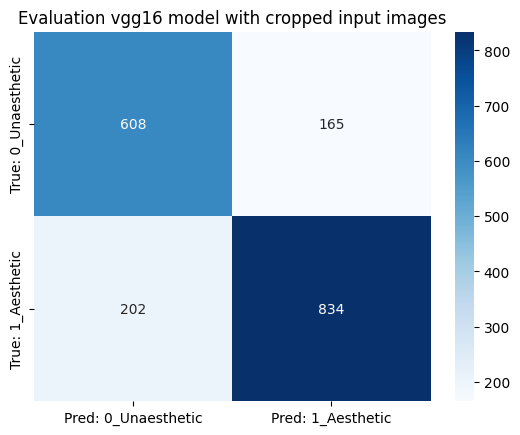

---------- padded ----------
Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.
Found 24000 images belonging to 2 classes.
750/750 [==============================] - 63s 84ms/step - loss: 0.8546 - accuracy: 0.6329
---------------------------------------------------------------
Train accuracy
0.8606
----------
Validation accuracy
0.8107
Test accuracy
0.7877
Test accuracy on GPD dataset
0.6329
----------
TrueNegative accuracy
0.7788
TruePositive accuracy
0.7944
Balanced accuracy
0.7866


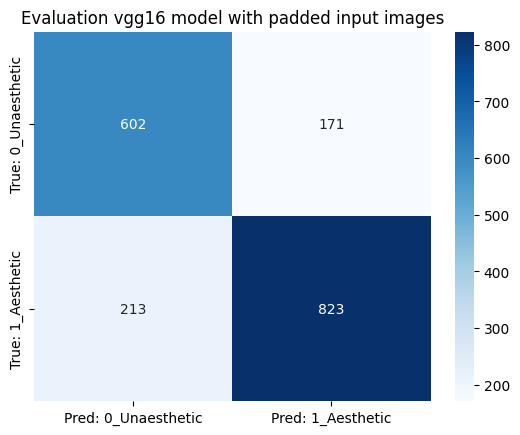

In [6]:
for i in test_cases:
    print('---------- %s ----------' % i)
    
    # load and iterate dataset
    train_data = datagen.flow_from_directory(globals()["RIAA_224_binary_"+str(i) +"_train_pth"], class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=True, seed=seed_value)
    val_data = datagen_test.flow_from_directory(globals()["RIAA_224_binary_"+str(i) + "_val_pth"], class_mode='binary',target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value)
    test_data = datagen_test.flow_from_directory(globals()["RIAA_224_binary_"+str(i) + "_test_pth"], class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )
    generalization_test = datagen_test.flow_from_directory(GPD_test_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )
    
    globals()["Eval_train_"+"vgg16_model_"+str(i)] = globals()["vgg16_model_"+str(i)].evaluate(train_data)
    globals()["Eval_val_"+"vgg16_model_"+str(i)] = globals()["vgg16_model_"+str(i)].evaluate(val_data)
    globals()["Eval_test_"+"vgg16_model_"+str(i)] =globals()["vgg16_model_"+str(i)].evaluate(test_data)
    globals()["Eval_gentest_"+"vgg16_model_"+str(i)] =globals()["vgg16_model_"+str(i)].evaluate(generalization_test)
    print('---------------------------------------------------------------' )
    
    print('Train accuracy')
    print(format(globals()["Eval_train_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('----------')
    
    print('Validation accuracy')
    print(format(globals()["Eval_val_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('Test accuracy')
    print(format(globals()["Eval_test_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('Test accuracy on GPD dataset')
    print(format(globals()["Eval_gentest_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('----------')
    
    globals()["true_classes_"+"vgg16_model_"+str(i)] = test_data.classes
    #globals()["reality"+"vgg16_model_"+str(i)] = [0 if x > 0.5 else 1 for x in globals()["true_classes_"+"vgg16_model_"+str(i)]]
    globals()["pred"+"vgg16_model_"+str(i)] =  globals()["vgg16_model_"+str(i)].predict(test_data)
    #globals()["predictions"+"vgg16_model_"+str(i)] = [0 if x > 0.5 else 1 for x in globals()["pred"+"vgg16_model_"+str(i)]]
    globals()["predicted_classes"+"vgg16_model_"+str(i)] = globals()["pred"+"vgg16_model_"+str(i)].round()
    globals()["cm"+"vgg16_model_"+str(i)] = confusion_matrix(globals()["true_classes_"+"vgg16_model_"+str(i)], globals()["predicted_classes"+"vgg16_model_"+str(i)])
    
    print('TrueNegative accuracy')
    TrueNegative=globals()["cm"+"vgg16_model_"+str(i)][0][0]/(globals()["cm"+"vgg16_model_"+str(i)][0][1]+globals()["cm"+"vgg16_model_"+str(i)][0][0])
    print(format(TrueNegative, '.4f'))
    print('TruePositive accuracy')
    TruePositive=globals()["cm"+"vgg16_model_"+str(i)][1][1]/(globals()["cm"+"vgg16_model_"+str(i)][1][0]+globals()["cm"+"vgg16_model_"+str(i)][1][1])
    print(format(TruePositive, '.4f'))
    print('Balanced accuracy')
    print(format((0.5*TrueNegative)+(0.5*TruePositive), '.4f'))
    
    sns.heatmap(globals()["cm"+"vgg16_model_"+str(i)], annot= True, xticklabels = ['Pred: 0_Unaesthetic', 'Pred: 1_Aesthetic'],
           yticklabels = ['True: 0_Unaesthetic', 'True: 1_Aesthetic'], cmap='Blues', fmt='g').set_title('Evaluation vgg16 model with ' +str(i)+ ' input images')
    plt.show()


In [7]:
test_cases = ["random"]

---------- random ----------
Found 14460 images belonging to 2 classes.
Found 1807 images belonging to 2 classes.
Found 1809 images belonging to 2 classes.
Found 24000 images belonging to 2 classes.
750/750 [==============================] - 56s 75ms/step - loss: 0.7008 - accuracy: 0.6243
---------------------------------------------------------------
Train accuracy
0.7270
----------
Validation accuracy
0.7748
Test accuracy
0.7634
Test accuracy on GPD dataset
0.6243
----------
TrueNegative accuracy
0.7594
TruePositive accuracy
0.7664
Balanced accuracy
0.7629


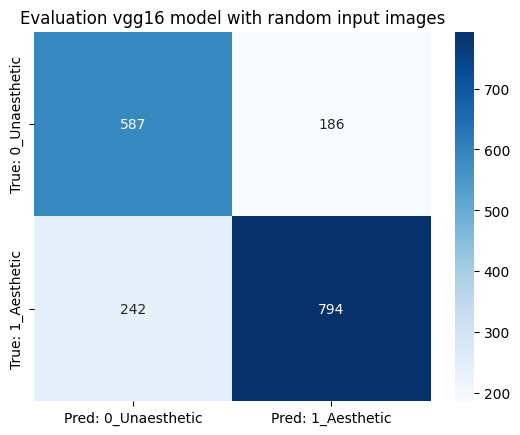

In [8]:
for i in test_cases:
    print('---------- %s ----------' % i)

# load and iterate dataset
    train_data = datagen_random.flow_from_directory(RIAA_224_binary_warped_train_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=True, seed=seed_value)
    val_data = datagen_test.flow_from_directory(RIAA_224_binary_warped_val_pth, class_mode='binary',target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value)
    test_data = datagen_test.flow_from_directory(RIAA_224_binary_warped_test_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )
    generalization_test = datagen_test.flow_from_directory(GPD_test_pth, class_mode='binary', target_size=(image_size, image_size),batch_size=32, shuffle=False, seed=seed_value )
    
    globals()["Eval_train_"+"vgg16_model_"+str(i)] = globals()["vgg16_model_"+str(i)].evaluate(train_data)
    globals()["Eval_val_"+"vgg16_model_"+str(i)] = globals()["vgg16_model_"+str(i)].evaluate(val_data)
    globals()["Eval_test_"+"vgg16_model_"+str(i)] =globals()["vgg16_model_"+str(i)].evaluate(test_data)
    globals()["Eval_gentest_"+"vgg16_model_"+str(i)] =globals()["vgg16_model_"+str(i)].evaluate(generalization_test)
    print('---------------------------------------------------------------' )
    
    print('Train accuracy')
    print(format(globals()["Eval_train_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('----------')
    
    print('Validation accuracy')
    print(format(globals()["Eval_val_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('Test accuracy')
    print(format(globals()["Eval_test_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('Test accuracy on GPD dataset')
    print(format(globals()["Eval_gentest_"+"vgg16_model_"+str(i)][1], '.4f'))
    print('----------')
    
    globals()["true_classes_"+"vgg16_model_"+str(i)] = test_data.classes
    #globals()["reality"+"vgg16_model_"+str(i)] = [0 if x > 0.5 else 1 for x in globals()["true_classes_"+"vgg16_model_"+str(i)]]
    globals()["pred"+"vgg16_model_"+str(i)] =  globals()["vgg16_model_"+str(i)].predict(test_data)
    #globals()["predictions"+"vgg16_model_"+str(i)] = [0 if x > 0.5 else 1 for x in globals()["pred"+"vgg16_model_"+str(i)]]
    globals()["predicted_classes"+"vgg16_model_"+str(i)] = globals()["pred"+"vgg16_model_"+str(i)].round()
    globals()["cm"+"vgg16_model_"+str(i)] = confusion_matrix(globals()["true_classes_"+"vgg16_model_"+str(i)], globals()["predicted_classes"+"vgg16_model_"+str(i)])
    
    print('TrueNegative accuracy')
    TrueNegative=globals()["cm"+"vgg16_model_"+str(i)][0][0]/(globals()["cm"+"vgg16_model_"+str(i)][0][1]+globals()["cm"+"vgg16_model_"+str(i)][0][0])
    print(format(TrueNegative, '.4f'))
    print('TruePositive accuracy')
    TruePositive=globals()["cm"+"vgg16_model_"+str(i)][1][1]/(globals()["cm"+"vgg16_model_"+str(i)][1][0]+globals()["cm"+"vgg16_model_"+str(i)][1][1])
    print(format(TruePositive, '.4f'))
    print('Balanced accuracy')
    print(format((0.5*TrueNegative)+(0.5*TruePositive), '.4f'))
    
    sns.heatmap(globals()["cm"+"vgg16_model_"+str(i)], annot= True, xticklabels = ['Pred: 0_Unaesthetic', 'Pred: 1_Aesthetic'],
           yticklabels = ['True: 0_Unaesthetic', 'True: 1_Aesthetic'], cmap='Blues', fmt='g').set_title('Evaluation vgg16 model with ' +str(i)+ ' input images')
    plt.show()


## Plot some images

In [9]:
pred = vgg16_model_random.predict(test_data)

In [10]:
right_pred_list= []
wrong_pred_list= []
classes=list(test_data.class_indices.keys())

In [11]:
for i in range(1809):
    if int(pred[i].round())==test_data.classes[i]:
        right_pred_list.append(i)   
    else:
        wrong_pred_list.append(i)

In [ ]:
import random
random.shuffle(right_pred_list)
random.shuffle(wrong_pred_list)

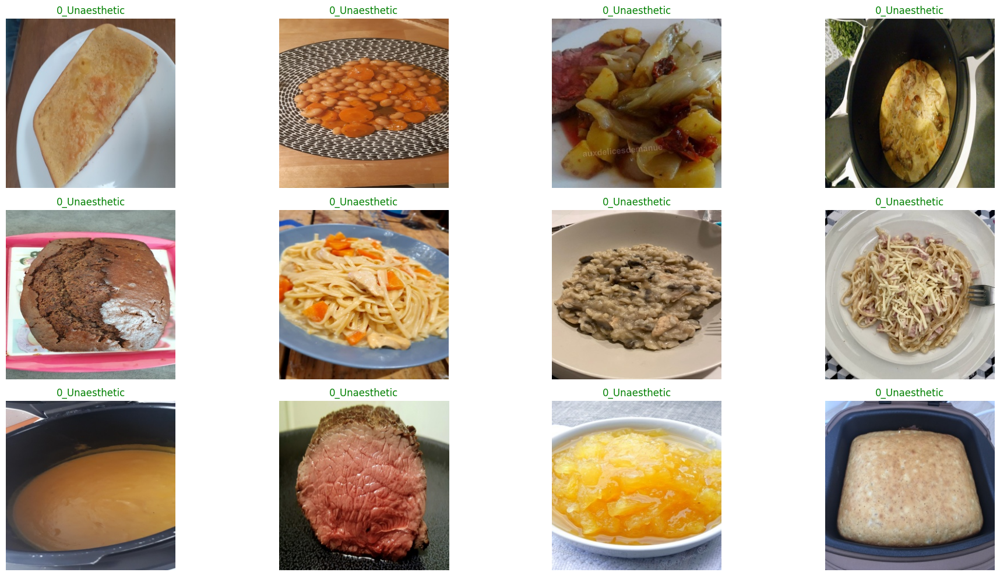

In [12]:
plt.figure(figsize=(20, 10))

for i in range(12):
    element= right_pred_list[i]
    plt.subplot(3, 4, i + 1)
    img_url=test_data.filenames[element]
    full_img_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_300', 'test', img_url).replace("\\","/")
    title_text= classes[int(pred[element].round())]
    #f'Pred: {int(pred[element].round())}, True: {test_data.classes[element]}'
    
    if int(pred[element].round())==test_data.classes[element]:
        color='g'
    else:
        color='r'
    
    img = plt.imread(full_img_pth)
    plt.imshow(img, cmap='jet')
    plt.title(title_text, color=color) 
    plt.axis('off')
    
plt.tight_layout()

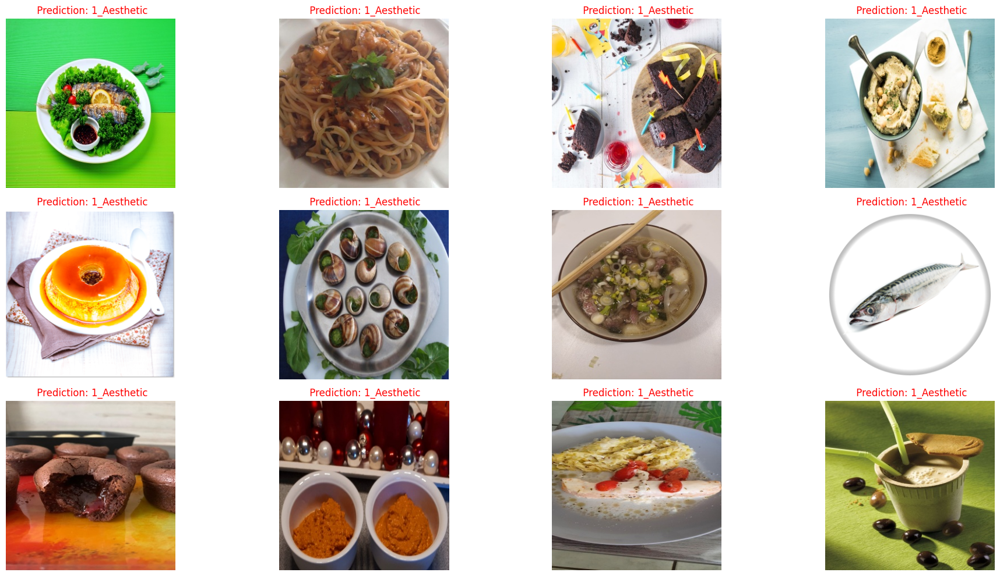

In [13]:
plt.figure(figsize=(20, 10))

for i in range(12):
    element= wrong_pred_list[i]
    plt.subplot(3, 4, i + 1)
    img_url=test_data.filenames[element]
    full_img_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_300', 'test', img_url).replace("\\","/")
    title_text=f' Prediction: {classes[int(pred[element].round())]}'
    #f'Pred: {int(pred[element].round())}, True: {test_data.classes[element]}'
    
    if int(pred[element].round())==test_data.classes[element]:
        color='g'
    else:
        color='r'
    
    img = plt.imread(full_img_pth)
    plt.imshow(img, cmap='jet')
    plt.title(title_text, color=color) 
    plt.axis('off')
    
plt.tight_layout()

In [14]:
pred = vgg16_model_cropped.predict(test_data)

In [21]:
right_pred_list= []
wrong_pred_list= []
pred_list=[]
classes=list(test_data.class_indices.keys())

In [22]:
for i in range(1809):
    pred_list.append(i)
    if int(pred[i].round())==test_data.classes[i]:
        right_pred_list.append(i)   
    else:
        wrong_pred_list.append(i)


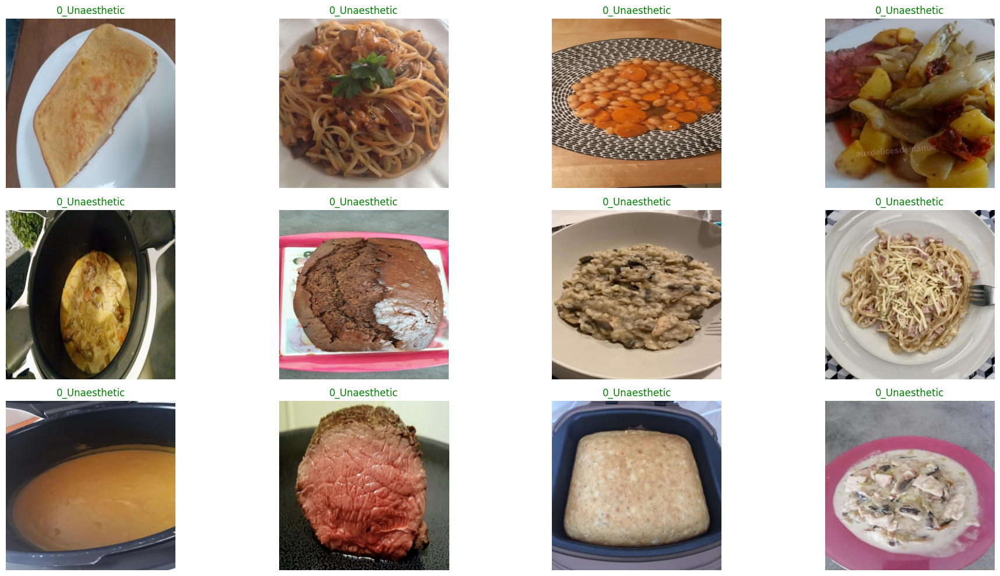

In [17]:
plt.figure(figsize=(20, 10))

for i in range(12):
    element= right_pred_list[i]
    plt.subplot(3, 4, i + 1)
    img_url=test_data.filenames[element]
    full_img_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_300', 'test', img_url).replace("\\","/")
    title_text= classes[int(pred[element].round())]
    #f'Pred: {int(pred[element].round())}, True: {test_data.classes[element]}'
    
    if int(pred[element].round())==test_data.classes[element]:
        color='g'
    else:
        color='r'
    
    img = plt.imread(full_img_pth)
    plt.imshow(img, cmap='jet')
    plt.title(title_text, color=color) 
    plt.axis('off')
    
plt.tight_layout()

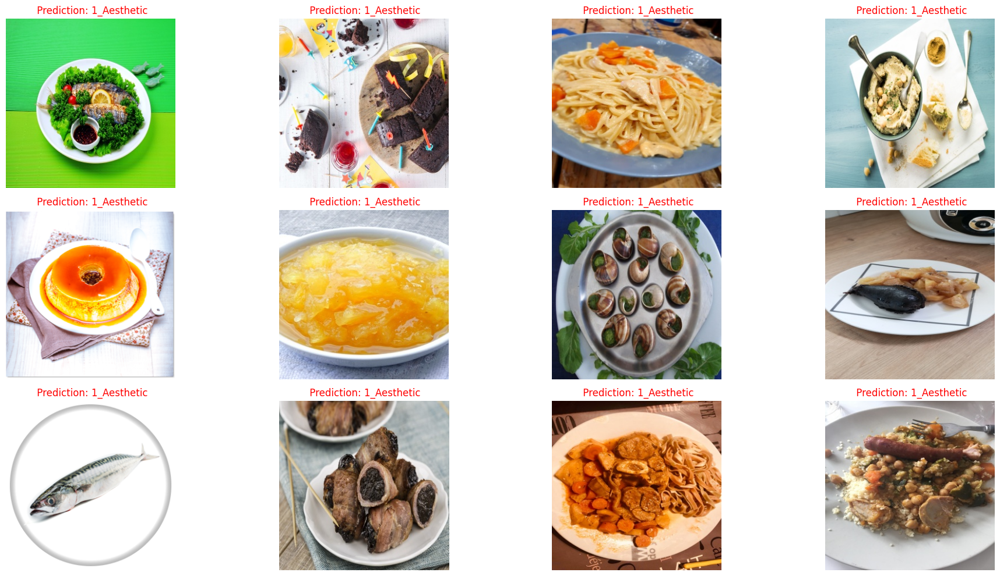

In [18]:
plt.figure(figsize=(20, 10))

for i in range(12):
    element= wrong_pred_list[i]
    plt.subplot(3, 4, i + 1)
    img_url=test_data.filenames[element]
    full_img_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_300', 'test', img_url).replace("\\","/")
    title_text=f' Prediction: {classes[int(pred[element].round())]}'
    #f'Pred: {int(pred[element].round())}, True: {test_data.classes[element]}'
    
    if int(pred[element].round())==test_data.classes[element]:
        color='g'
    else:
        color='r'
    
    img = plt.imread(full_img_pth)
    plt.imshow(img, cmap='jet')
    plt.title(title_text, color=color) 
    plt.axis('off')
    
plt.tight_layout()

## Test on Image effects

In [5]:
from glob import glob
import cv2
ImageFile.LOAD_TRUNCATED_IMAGES = True

path= os.path.join(image_effects_pth , 'Original', '*').replace("\\","/")
some_images_effects = glob(path, recursive = True)

In [35]:
dim=(224,224)
for i in range(1):
        from_image_dir= some_images_effects[2].replace("\\","/")
        img = cv2.imread(from_image_dir)
        resized_img = cv2.resize(img, dim)
        imageurl =os.path.split(from_image_dir)[1]
        into_image_dir= os.path.join(image_effects_pth, 'Resized' ,  str(imageurl))
        cv2.imwrite(into_image_dir, resized_img)

In [7]:
#loading best models
model_vgg16 = tf.keras.models.load_model(os.path.join(checkpoint_dir, 'vanilla_vgg16_base_model-027-0.788-0.807.h5').replace("\\","/"))

In [8]:
path= os.path.join(image_effects_pth, '*').replace("\\","/")
some_images_effects = glob(path, recursive = True)

In [9]:
image_effects_pth= os.path.join(RIAA_pth, 'Image_Settings').replace("\\","/")

In [10]:
from keras.preprocessing import image
#https://stackoverflow.com/questions/43469281/how-to-predict-input-image-using-trained-model-in-keras 05.12.2022

def load_image(img_path, size):

    img = image.load_img(img_path, target_size=(size,size))
    img_tensor = image.img_to_array(img)                    # (height, width, channels)
    img_tensor = np.expand_dims(img_tensor, axis=0)         # (1, height, width, channels), add a dimension because the model expects this shape: (batch_size, height, width, channels)
    img_tensor /= 255.                                      # imshow expects values in the range [0, 1]

    return img_tensor


In [31]:
path_resized= os.path.join(image_effects_pth,'Resized', 'Ratios' , '*').replace("\\","/")
some_images_effects_resized = glob(path_resized, recursive = True)

path_original= os.path.join(image_effects_pth,'Original', 'Ratios' , '*').replace("\\","/")
some_images_effects_original = glob(path_original, recursive = True)

In [32]:
len(some_images_effects_resized)

8

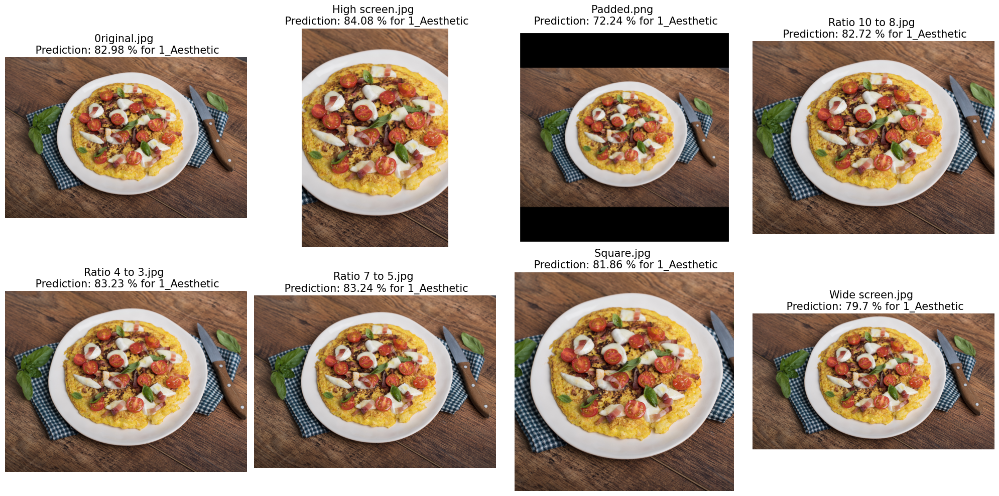

In [35]:
plt.figure(figsize=(20, 10))

#pred_value_round=[ '%.4f' % elem for elem in pred[0]]

for i in range(8):
    
    plt.subplot(2,4, i + 1)
    img_url=some_images_effects_resized[i]
    img_url_original=some_images_effects_original[i]
    #full_img_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_300', 'test', img_url).replace("\\","/")
    img_tensor= load_image(img_url,224)
    pred = model_vgg16.predict(img_tensor)
    pred_value_round=[ '%.4f' % elem for elem in pred[0]]
    pred_val=float(pred_value_round[0]) *100
    title_text= f'{os.path.split(img_url)[1]} \n Prediction: {str(pred_val)[:5]} % for 1_Aesthetic'    
    img = plt.imread(img_url_original)
    plt.imshow(img, cmap='jet')
    plt.title(title_text, fontsize=15) 
    plt.axis('off')
    
plt.tight_layout()

In [14]:
path_resized= os.path.join(image_effects_pth,'Resized', 'Effects' , '*').replace("\\","/")
some_images_effects_resized = glob(path_resized, recursive = True)

path_original= os.path.join(image_effects_pth,'Original', 'Effects' , '*').replace("\\","/")
some_images_effects_original = glob(path_original, recursive = True)

In [15]:
len(some_images_effects_resized)

10

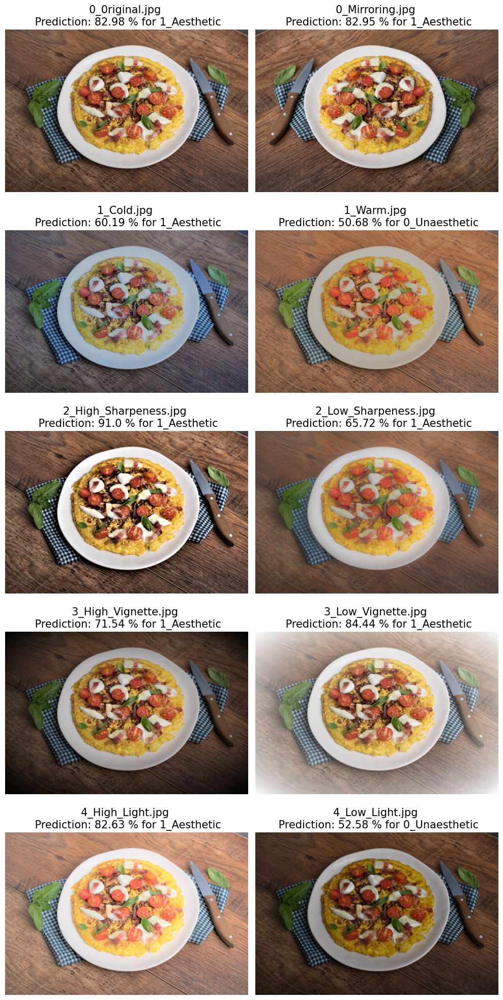

In [30]:
plt.figure(figsize=(10, 20))

for i in range(10):
    
    plt.subplot(5,2, i + 1)
    img_url=some_images_effects_resized[i]
    img_url_original=some_images_effects_original[i]
    #full_img_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_300', 'test', img_url).replace("\\","/")
    img_tensor= load_image(img_url,224)
    pred = model_vgg16.predict(img_tensor)
    pred_value_round=[ '%.4f' % elem for elem in pred[0]]
       
    if float(pred_value_round[0]) >= 0.5:
        pred_percentage= float(pred_value_round[0]) *100
        title_text= f'{os.path.split(img_url)[1]} \n Prediction: {str(pred_percentage)[:5]} % for 1_Aesthetic'
    else:
        pred_percentage=100 - (float(pred_value_round[0]) *100)
        title_text= f'{os.path.split(img_url)[1]} \n Prediction: {str(pred_percentage)[:5]} % for 0_Unaesthetic'
    
    #title_text= f'{os.path.split(img_url)[1]} \n Prediction: {pred_value_round[0]}≈{int(pred[0].round())} '    
    img = plt.imread(img_url_original)
    plt.imshow(img, cmap='jet')
    plt.title(title_text, fontsize=15) 
    plt.axis('off')
    
    
plt.tight_layout()

In [36]:
path_resized= os.path.join(image_effects_pth,'Resized', 'Improved' , '*').replace("\\","/")
some_images_effects_resized = glob(path_resized, recursive = True)

path_original= os.path.join(image_effects_pth,'Original', 'Improved' , '*').replace("\\","/")
some_images_effects_original = glob(path_original, recursive = True)

In [16]:
len(some_images_effects_resized)

4

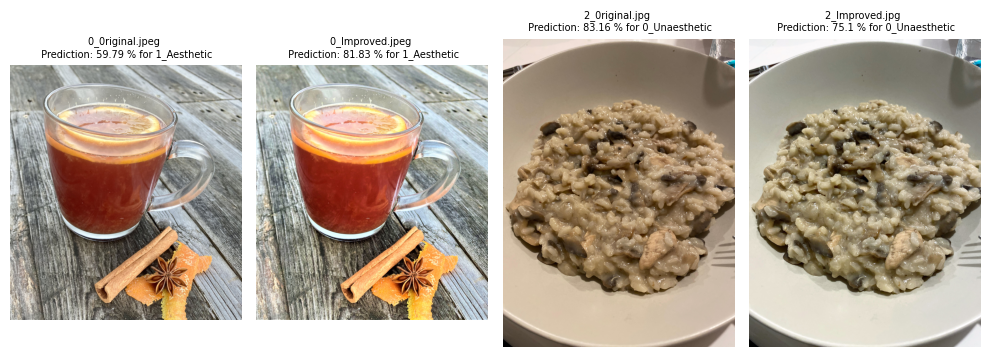

In [38]:
plt.figure(figsize=(10, 20))

for i in range(4):
    
    plt.subplot(1,4, i + 1)
    img_url=some_images_effects_resized[i]
    img_url_original=some_images_effects_original[i]
    #full_img_pth = os.path.join(RIAA_pth, 'Data_Split_Binary_300', 'test', img_url).replace("\\","/")
    img_tensor= load_image(img_url,224)
    pred = model_vgg16.predict(img_tensor)
    pred_value_round=[ '%.4f' % elem for elem in pred[0]]
       
    if float(pred_value_round[0]) >= 0.5:
        pred_percentage= float(pred_value_round[0]) *100
        title_text= f'{os.path.split(img_url)[1]} \n Prediction: {str(pred_percentage)[:5]} % for 1_Aesthetic'
    else:
        pred_percentage=100 - (float(pred_value_round[0]) *100)
        title_text= f'{os.path.split(img_url)[1]} \n Prediction: {str(pred_percentage)[:5]} % for 0_Unaesthetic'
        
    #title_text= f'{os.path.split(img_url)[1]} \n Prediction:{100 - (float(pred_value_round[0]) *100)} % for 1_Aesthetic'
    #f'{os.path.split(img_url)[1]} \n Prediction: {pred_value_round[0]}≈{int(pred[0].round())} '    
    img = plt.imread(img_url_original)
    plt.imshow(img, cmap='jet')
    plt.title(title_text, fontsize=7) 
    plt.axis('off')
    
plt.tight_layout()